In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import stereo as st
import warnings
import os
from pycirclize import Circos
warnings.filterwarnings('ignore')

In [2]:
adata = sc.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD4_CD8A_highly_variable_combat_CR_NR.h5ad')
adata

AnnData object with n_obs × n_vars = 47244 × 6770
    obs: 'channel', 'barcode', 'timepoint', 'timepoint_fine', 'product', 'generic', 'nTisa', 'nAxi', 'CAR', 'n_genes_by_counts', 'total_counts', 'response', 'cdr3_TRA', 'cdr3_TRB', 'batch_id', 'organization', 'n_genes', 'total_counts_mt', 'pct_counts_mt', 'doublet_scores', 'predicted_doublets', 'n_counts', 'leiden_0.9', 'cell_type', 'category'
    var: 'feature_types', 'gene_ids-0', 'genome-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'gene_ids-1', 'genome-0-1', 'genome-1-1', 'genome-2-1', 'genome-3-1', 'genome-4-1', 'genome-5-1', 'genome-6-1', 'genome-7-1', 'genome-8-1', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'log1p'

In [9]:
adata_13 = adata[adata.obs['leiden_0.9'] == '13']
adata_13.obs['cell_type'].value_counts()

CD8    1272
CD4     987
Name: cell_type, dtype: int64

In [13]:
adata_CD4 = adata_13[adata_13.obs['cell_type'] == 'CD4']
adata_CD4.obs['response'].value_counts()

NR    868
CR    119
Name: response, dtype: int64

In [14]:
adata_CD8 = adata_13[adata_13.obs['cell_type'] == 'CD8']
adata_CD8.obs['response'].value_counts()

NR    1120
CR     152
Name: response, dtype: int64

In [3]:
# adata = adata[adata.obs['cell_type'] == 'CD8'].copy()
# cluster_cell = {
#     '0': 'Effector_b',
#     '1': 'Proliferation_b',
#     '2': 'Memory_b',
#     '3': 'Memory_a',
#     '4': 'Proliferation_b',
#     '5': 'Memory_b',
#     '6': 'Memory_b',
#     '7': 'Effector_b',
#     '8': 'Proliferation_b',
#     '9': 'Effector_a',
#     '10': 'Effector_b',
#     '11': 'Proliferation_a',
#     '12': 'Memory_a',
#     '13': 'T-NKs',
#     '14': 'Effector_a',
#     '15': 'Effector_b'
# }

# # Apply the mapping to create a new column
# adata.obs['category'] = adata.obs['leiden_0.9'].map(cluster_cell)
# adata.write_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD8_highly_variable_combat_CR_NR.h5ad')
# adata

... storing 'category' as categorical


AnnData object with n_obs × n_vars = 27584 × 6770
    obs: 'channel', 'barcode', 'timepoint', 'timepoint_fine', 'product', 'generic', 'nTisa', 'nAxi', 'CAR', 'n_genes_by_counts', 'total_counts', 'response', 'cdr3_TRA', 'cdr3_TRB', 'batch_id', 'organization', 'n_genes', 'total_counts_mt', 'pct_counts_mt', 'doublet_scores', 'predicted_doublets', 'n_counts', 'leiden_0.9', 'cell_type', 'category'
    var: 'feature_types', 'gene_ids-0', 'genome-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'gene_ids-1', 'genome-0-1', 'genome-1-1', 'genome-2-1', 'genome-3-1', 'genome-4-1', 'genome-5-1', 'genome-6-1', 'genome-7-1', 'genome-8-1', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'log1p'

In [3]:
adata = adata[adata.obs['cell_type'] == 'CD8'].copy()
adata_CD8_CR = adata[adata.obs['response'] == 'CR'].copy()
adata_CD8_NR = adata[adata.obs['response'] == 'NR'].copy()
print(adata_CD8_CR.shape, adata_CD8_NR.shape)
adata_CD8_CR.write_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD8_highly_variable_combat_CR.h5ad')
adata_CD8_NR.write_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD8_highly_variable_combat_NR.h5ad')

(10614, 6770) (16970, 6770)


In [4]:
import pandas as pd
import matplotlib.pyplot as plt

def ccc_circos_plot_from_csv(
        csv_path: str,
        separator_cluster: str = '|',
        palette: str = "RdYlBu_r",
        width: int = 8,
        height: int = 8
):
    significant_df = pd.read_csv(csv_path)
    significant_df = significant_df.drop(
            ['id_cp_interaction', 'interacting_pair', 'partner_a', 'partner_b', 'gene_a', 'gene_b', 'secreted',
             'receptor_a', 'receptor_b', 'annotation_strategy', 'is_integrin', 'rank'], axis=1, errors='ignore')
    significant_df.replace(-1, np.nan, inplace=True)
    significant_df = significant_df.dropna(how='all').reset_index(drop=True)
    #print(significant_df.head(10))
    cluster_pair = significant_df.columns.tolist()
    print(cluster_pair)
    print('*****')
    

    cell_types = [x.split(separator_cluster) for x in cluster_pair]
    #print(cell_types)
    cell_types = list(set([item for sublist in cell_types for item in sublist]))
    #print(cell_types)
    cell_types.sort()
    print(cell_types)

    number_matrix = pd.DataFrame(index=cell_types, columns=cell_types)
    for source in cell_types:
        for target in cell_types:
            combined_key = source + separator_cluster + target
            if combined_key in significant_df.columns:
                number_matrix.loc[source, target] = significant_df[combined_key].count()
    number_matrix = number_matrix.fillna(0)

    ligand_totals = number_matrix.sum(axis=1)
    receptor_totals = number_matrix.sum(axis=0)
    print("Ligand Totals by Cell Type:")
    print(ligand_totals)
    print("\nReceptor Totals by Cell Type:")
    print(receptor_totals)

    #from Circos import Circos  # Make sure to have a correct Circos module available
    circos = Circos.initialize_from_matrix(
        number_matrix,
        space=5,
        cmap=palette,
        label_kws=dict(size=20),
        link_kws=dict(ec="black", lw=0.5, direction=1),
    )
    fig, ax = plt.subplots(figsize=(width, height), subplot_kw={"projection": "polar"})
    circos.plotfig(ax=ax)
    return fig

[2024-07-29 08:44:43][Stereo][400792][MainThread][139956980344640][st_pipeline][77][INFO]: register algorithm cell_cell_communication to <stereo.core.st_pipeline.AnnBasedStPipeline object at 0x7f484882ceb0>
[2024-07-29 08:44:43][Stereo][400792][MainThread][139956980344640][main][128][INFO]: species: HUMAN
[2024-07-29 08:44:43][Stereo][400792][MainThread][139956980344640][main][129][INFO]: database: liana
[2024-07-29 08:44:43][Stereo][400792][MainThread][139956980344640][main][188][INFO]: [statistical analysis] Threshold:0.1 Precision:3 Iterations:500 Threads:1
[2024-07-29 08:44:44][Stereo][400792][MainThread][139956980344640][main][218][INFO]: Running Real Analysis
[2024-07-29 08:44:44][Stereo][400792][MainThread][139956980344640][main][232][INFO]: Running Statistical Analysis
statistical analysis: 100%|███████████████████████████████████████| 500/500 [00:20<00:00, 24.70it/s]
[2024-07-29 08:45:04][Stereo][400792][MainThread][139956980344640][main][1032][INFO]: Building Pvalues result
[

['Effector|Effector', 'Effector|Memory', 'Effector|Proliferation', 'Effector|T-MacNK', 'Memory|Effector', 'Memory|Memory', 'Memory|Proliferation', 'Memory|T-MacNK', 'Proliferation|Effector', 'Proliferation|Memory', 'Proliferation|Proliferation', 'Proliferation|T-MacNK', 'T-MacNK|Effector', 'T-MacNK|Memory', 'T-MacNK|Proliferation', 'T-MacNK|T-MacNK']
*****
['Effector', 'Memory', 'Proliferation', 'T-MacNK']
Ligand Totals by Cell Type:
Effector         720
Memory           599
Proliferation    486
T-MacNK          973
dtype: int64

Receptor Totals by Cell Type:
Effector         750
Memory           532
Proliferation    572
T-MacNK          924
dtype: int64


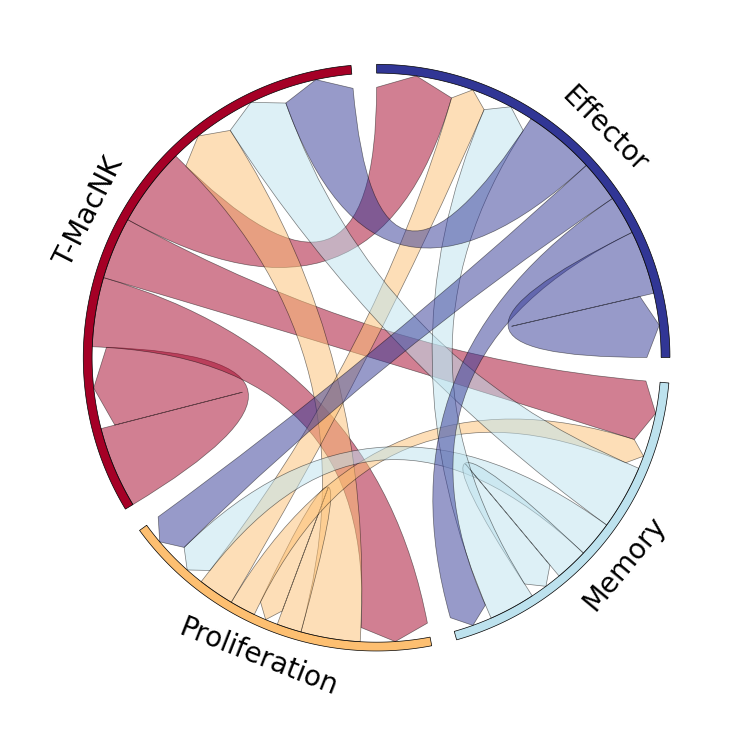

[2024-07-29 08:45:05][Stereo][400792][MainThread][139956980344640][plot_collection][84][INFO]: register plot_func ccc_heatmap to <stereo.plots.plot_collection.PlotCollection object at 0x7f4848855490>
[2024-07-29 08:45:05][Stereo][400792][MainThread][139956980344640][plot_ccc][160][INFO]: Generating heatmap plot


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

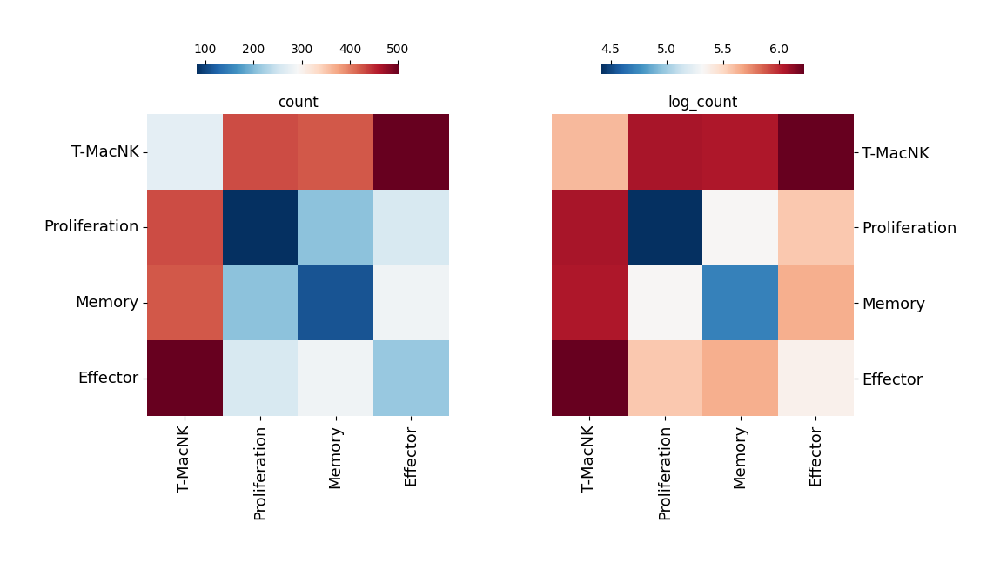

In [11]:
adata_CD8_CR = st.io.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD8_highly_variable_combat_CR.h5ad')

adata_CD8_CR.tl.cell_cell_communication(
    analysis_type='statistical',
    cluster_res_key='category',
    species='HUMAN',
    database='liana',
    pvalue = 0.05,
    res_key='cell_cell_communication',
    output_path='/home/emma/result/CART/circos'
)
fig = ccc_circos_plot_from_csv('/home/emma/result/CART/circos/significant_means.csv')
fig.savefig('/home/emma/result/CART/circos/adata_CD8_CR_circos_plot.png', dpi=300)
plt.show()
adata_CD8_CR.plt.ccc_heatmap(palette='RdBu_r', res_key='cell_cell_communication')

[2024-07-29 08:45:05][Stereo][400792][MainThread][139956980344640][plot_collection][84][INFO]: register plot_func ccc_dot_plot to <stereo.plots.plot_collection.PlotCollection object at 0x7f4848855490>
[2024-07-29 08:45:05][Stereo][400792][MainThread][139956980344640][plot_ccc][74][INFO]: Generating dot plot


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

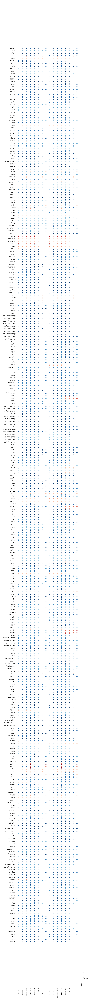

In [12]:
adata_CD8_CR.plt.ccc_dot_plot(palette='RdBu_r', res_key='cell_cell_communication')

[2024-07-29 08:45:10][Stereo][400792][MainThread][139956980344640][st_pipeline][77][INFO]: register algorithm cell_cell_communication to <stereo.core.st_pipeline.AnnBasedStPipeline object at 0x7f4849058c70>
[2024-07-29 08:45:10][Stereo][400792][MainThread][139956980344640][main][128][INFO]: species: HUMAN
[2024-07-29 08:45:10][Stereo][400792][MainThread][139956980344640][main][129][INFO]: database: liana
[2024-07-29 08:45:10][Stereo][400792][MainThread][139956980344640][main][188][INFO]: [statistical analysis] Threshold:0.1 Precision:3 Iterations:500 Threads:1
[2024-07-29 08:45:10][Stereo][400792][MainThread][139956980344640][main][218][INFO]: Running Real Analysis
[2024-07-29 08:45:10][Stereo][400792][MainThread][139956980344640][main][232][INFO]: Running Statistical Analysis
statistical analysis: 100%|███████████████████████████████████████| 500/500 [00:25<00:00, 19.85it/s]
[2024-07-29 08:45:36][Stereo][400792][MainThread][139956980344640][main][1032][INFO]: Building Pvalues result
[

['Effector|Effector', 'Effector|Memory', 'Effector|Proliferation', 'Effector|T-MacNK', 'Memory|Effector', 'Memory|Memory', 'Memory|Proliferation', 'Memory|T-MacNK', 'Proliferation|Effector', 'Proliferation|Memory', 'Proliferation|Proliferation', 'Proliferation|T-MacNK', 'T-MacNK|Effector', 'T-MacNK|Memory', 'T-MacNK|Proliferation', 'T-MacNK|T-MacNK']
*****
['Effector', 'Memory', 'Proliferation', 'T-MacNK']
Ligand Totals by Cell Type:
Effector         706
Memory           722
Proliferation    466
T-MacNK          951
dtype: int64

Receptor Totals by Cell Type:
Effector         725
Memory           629
Proliferation    527
T-MacNK          964
dtype: int64


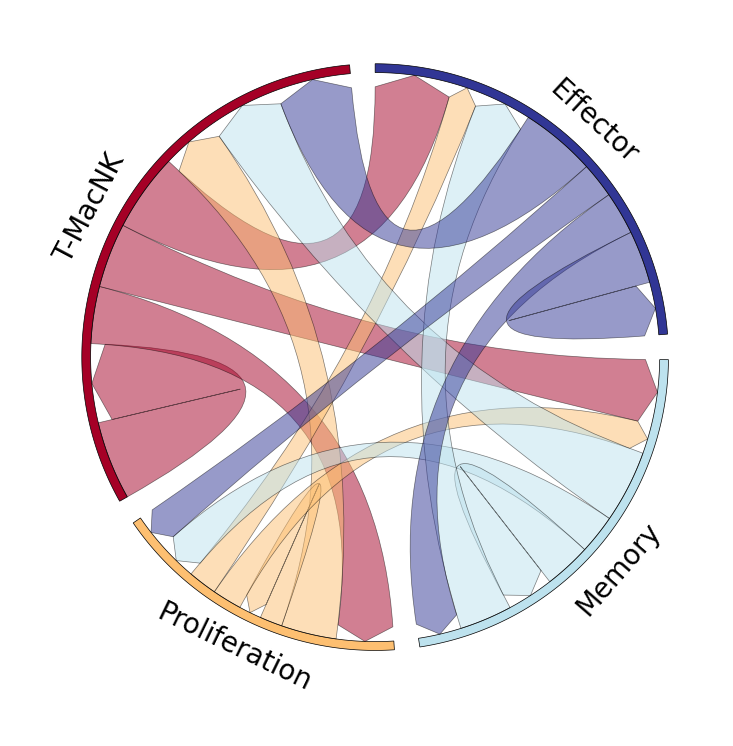

[2024-07-29 08:45:36][Stereo][400792][MainThread][139956980344640][plot_collection][84][INFO]: register plot_func ccc_heatmap to <stereo.plots.plot_collection.PlotCollection object at 0x7f4841c41a00>
[2024-07-29 08:45:36][Stereo][400792][MainThread][139956980344640][plot_ccc][160][INFO]: Generating heatmap plot


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

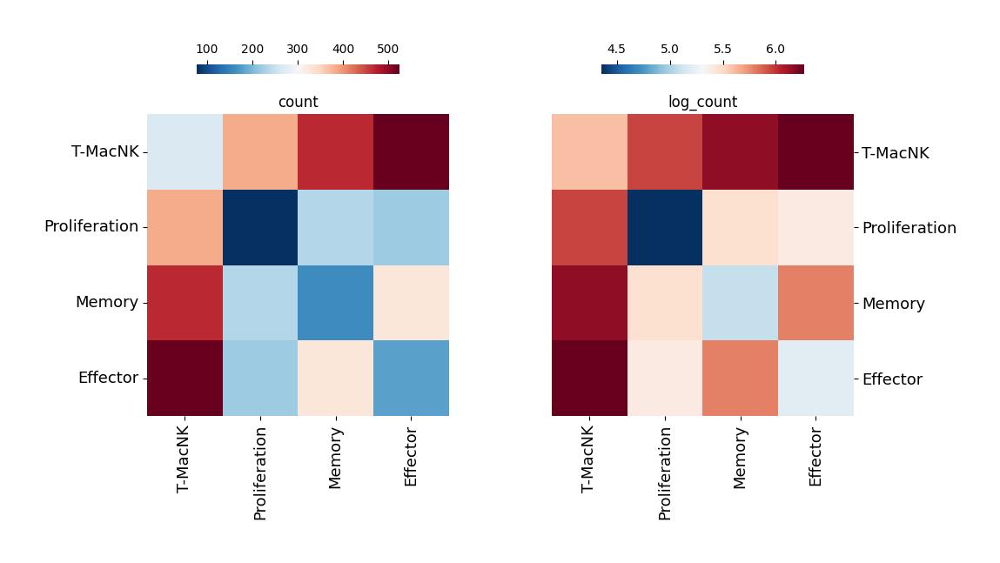

In [13]:
adata_CD8_NR = st.io.read_h5ad('/home/emma/data/CART/Harvard_Stanford_infusion_D7sorted_CD3E_CD8_highly_variable_combat_NR.h5ad')

adata_CD8_NR.tl.cell_cell_communication(
    analysis_type='statistical',
    cluster_res_key='category',
    species='HUMAN',
    database='liana',
    pvalue = 0.05,
    res_key='cell_cell_communication',
    output_path='/home/emma/result/CART/circos'
)

fig = ccc_circos_plot_from_csv('/home/emma/result/CART/circos/significant_means.csv')
fig.savefig('/home/emma/result/CART/circos/adata_CD8_NR_circos_plot.png', dpi=300)
plt.show()
adata_CD8_NR.plt.ccc_heatmap(palette='RdBu_r', res_key='cell_cell_communication')

[2024-07-29 08:45:37][Stereo][400792][MainThread][139956980344640][plot_collection][84][INFO]: register plot_func ccc_dot_plot to <stereo.plots.plot_collection.PlotCollection object at 0x7f4841c41a00>
[2024-07-29 08:45:37][Stereo][400792][MainThread][139956980344640][plot_ccc][74][INFO]: Generating dot plot


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

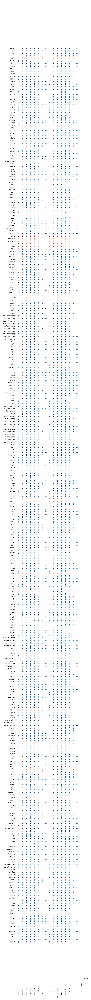

In [14]:
adata_CD8_NR.plt.ccc_dot_plot(palette='RdBu_r', res_key='cell_cell_communication')